# YOLOv5






## Импорт библиотек

In [1]:
!sed -i 's/from scipy.spatial import ConvexHull, QhullError/from scipy.spatial import ConvexHull/g' /opt/conda/lib/python3.10/site-packages/skimage/morphology/convex_hull.py


In [2]:
!pip install albumentations==0.4.6
import albumentations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.2/117.2 kB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for albumentations: filename=albumentations-0.4.6-py3-none-any.whl size=65173 sha256=d78826f8ad3de07b01ab73161bfcc4006bc3bc005303090d61e603d6ef39337c
  Stored in directory: /root/.cache/pip/wheels/f9/d7/0c/6ed42fd872f7d1af78b25045f8b16be330f2c70ae72c83e37d
Successfully built albumentations
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.3.1
    Uninstalling albumentations-1.3.1:
      Successfully uninstalled albumentations-1.3.1


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
# Для загрузки и анализа данных
import os
import tarfile
import urllib.request
import glob
import pandas as pd
import numpy as np
import xml.etree.ElementTree as ET
from tqdm import tqdm
from sklearn import preprocessing
from time import time

# Для работы с изображениями и построения модели
import torch
import torchvision
from torchvision import transforms
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from albumentations.pytorch import ToTensor
from torch.utils.data import DataLoader, Dataset
from PIL import Image, ImageDraw
from albumentations import (HorizontalFlip, ShiftScaleRotate, VerticalFlip, Normalize,Flip,
                            Compose, GaussNoise)
import cv2
import shutil
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from IPython.display import display
import yaml
import torchvision.models as models
import torchvision.transforms as T
import time
import random

## Load data

In [4]:
# load dataset
if not os.path.exists("VOCdevkit"):
    if not os.path.exists("VOC.tar"):
        urllib.request.urlretrieve(
            "http://host.robots.ox.ac.uk/pascal/VOC/voc2012/VOCtrainval_11-May-2012.tar", "VOC.tar"
        )
    with tarfile.open("VOC.tar") as tar:
        tar.extractall()
#https://pjreddie.com/media/files/VOCtrainval_11-May-2012.tar

In [5]:

def xml_to_csv(path = 'VOCdevkit/VOC2012/Annotations/'):
    xml_list = []
    for xml_file in tqdm(glob.glob(path + '/2010*.xml')):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for obj in root.findall('object'):
            bbx = obj.find('bndbox')
            xmin = int(bbx.find('xmin').text)
            ymin = int(bbx.find('ymin').text)
            xmax = int(bbx.find('xmax').text)
            ymax = int(bbx.find('ymax').text)
            label = obj.find('name').text

            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[2].text),
                     int(root.find('size')[1].text),
                     label,
                     xmin,
                     ymin,
                     xmax,
                     ymax
                     )
            xml_list.append(value)
    column_name = ['filename', 'channels', 'width', 'height',
                   'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df

In [6]:
xml_df = xml_to_csv()
xml_df.to_csv('VOC_2010.csv', index=None)
print('Конвертация прошла успешно.')

100%|██████████| 3503/3503 [00:00<00:00, 9210.66it/s]


Конвертация прошла успешно.


In [7]:
xml_df = xml_df[:3000]

In [8]:
xml_df.head(100)

,filename,channels,width,height,class,xmin,ymin,xmax,ymax
0,2010_002191.jpg,3,500,375,sofa,127,203,400,337
1,2010_002191.jpg,3,500,375,chair,393,178,477,275
2,2010_002191.jpg,3,500,375,chair,1,182,80,276
3,2010_002191.jpg,3,500,375,person,179,128,198,174
4,2010_002191.jpg,3,500,375,sofa,75,311,500,375
...,...,...,...,...,...,...,...,...,...
95,2010_004692.jpg,3,500,375,person,88,100,346,244
96,2010_004692.jpg,3,500,375,car,88,11,123,38
97,2010_004692.jpg,3,500,375,car,263,13,332,44
98,2010_000175.jpg,3,500,333,cat,133,1,500,333


In [9]:
print(f'Общее количество объектов {xml_df.shape[0]}')
print(f'Количество изображений в датафрэйме {len(np.unique(xml_df["filename"]))}')

Общее количество объектов 3000
Количество изображений в датафрэйме 1326


## Preprocessing

### Labeling

In [10]:
le = preprocessing.LabelEncoder()
xml_df['class'] = le.fit_transform(xml_df['class'])

In [11]:
xml_df.head()

,filename,channels,width,height,class,xmin,ymin,xmax,ymax
0,2010_002191.jpg,3,500,375,17,127,203,400,337
1,2010_002191.jpg,3,500,375,8,393,178,477,275
2,2010_002191.jpg,3,500,375,8,1,182,80,276
3,2010_002191.jpg,3,500,375,14,179,128,198,174
4,2010_002191.jpg,3,500,375,17,75,311,500,375


In [12]:
len(xml_df['class'].unique())

20

Сохраним кодировку классов в переменной mapping.

In [13]:
mapping = dict(zip(le.classes_, range(len(le.classes_))))

In [14]:
mapping

{'aeroplane': 0,
 'bicycle': 1,
 'bird': 2,
 'boat': 3,
 'bottle': 4,
 'bus': 5,
 'car': 6,
 'cat': 7,
 'chair': 8,
 'cow': 9,
 'diningtable': 10,
 'dog': 11,
 'horse': 12,
 'motorbike': 13,
 'person': 14,
 'pottedplant': 15,
 'sheep': 16,
 'sofa': 17,
 'train': 18,
 'tvmonitor': 19}

### Convert to YOLO format

In [15]:
def convert_to_yolov5(df, unique_img_names):

    df_array = np.array(df)

    # for each object
    for i in range(len(df)):
        print_buffer = []

        point =  df_array[i]
        img_name = point[0]

        # for each unique object
        for unique_img_name in unique_img_names:
           if img_name == unique_img_name:

              class_id = point[4]

              # converting bbox
              X = (point[5] + point[7]) / 2.0
              Y = (point[6] + point[8]) / 2.0
              Width    = (point[7] - point[5])
              Height   = (point[8] - point[6])

              # cordinate normalization
              image_c, image_w, image_h = point[1], float(point[2]), float(point[3])
              X /= image_w
              Y /= image_h
              Width    /= image_w
              Height   /= image_h

              # add to bbbox file
              print_buffer.append("{} {:.3f} {:.3f} {:.3f} {:.3f}".format(class_id, X, Y, Width, Height))

        # give name to file
        save_file_name = os.path.join("VOCdevkit/VOC2012/JPEGImages/", img_name.replace("jpg", "txt"))

        # save
        print("\n".join(print_buffer), file= open(save_file_name, "w"))

In [16]:
# get unique file names
unique_img_names = xml_df['filename'].unique()
print(len(unique_img_names))

1326


In [17]:
# convert
convert_to_yolov5(xml_df, unique_img_names)

Transfom annotations using visualization

In [18]:
class_id_to_name_mapping = dict(zip(mapping.values(), mapping.keys()))

In [19]:
def plot_bounding_box(image, annotation_list):
    annotations = np.array(annotation_list)
    w, h = image.size

    plotted_image = ImageDraw.Draw(image)

    transformed_annotations = np.copy(annotations)
    print(transformed_annotations)
    transformed_annotations[:,[1,3]] = annotations[:,[1,3]] * w
    transformed_annotations[:,[2,4]] = annotations[:,[2,4]] * h

    transformed_annotations[:,1] = transformed_annotations[:,1] - (transformed_annotations[:,3] / 2)
    transformed_annotations[:,2] = transformed_annotations[:,2] - (transformed_annotations[:,4] / 2)
    transformed_annotations[:,3] = transformed_annotations[:,1] + transformed_annotations[:,3]
    transformed_annotations[:,4] = transformed_annotations[:,2] + transformed_annotations[:,4]

    for ann in transformed_annotations:
        obj_cls, x0, y0, x1, y1 = ann
        plotted_image.rectangle(((x0,y0), (x1,y1)))

        plotted_image.text((x0, y0 - 10), class_id_to_name_mapping[(int(obj_cls))], fill="#000")


    plt.imshow(np.array(image))
    plt.show()

In [20]:
# choose random annotations
annotation_random= !ls VOCdevkit/VOC2012/JPEGImages/*txt | shuf -n 1

In [21]:
annotation_random

['VOCdevkit/VOC2012/JPEGImages/2010_006753.txt']

In [22]:
def normalize_images_in_folder(folder_path):
    # Iterate through all files in the folder
    for filename in os.listdir(folder_path):
        if filename.endswith((".jpg", ".jpeg", ".png")):
            image_path = os.path.join(folder_path, filename)
            image = cv2.imread(image_path)  # Load the image

            if image is not None:
                normalized_image = image / 255.0  # Normalize pixel values to [0, 1]
                yield normalized_image

In [23]:
class_id_to_name_mapping = dict(zip(mapping.values(), mapping.keys()))
annotation_random= !ls /kaggle/working/VOCdevkit/VOC2012/JPEGImages/*txt | shuf -n 1
annotation_random
normalize_images_in_folder("/kaggle/working/VOCdevkit/VOC2012/JPEGImages")

<generator object normalize_images_in_folder at 0x794463fac580>

[[14.     0.497  0.663  0.826  0.674]]


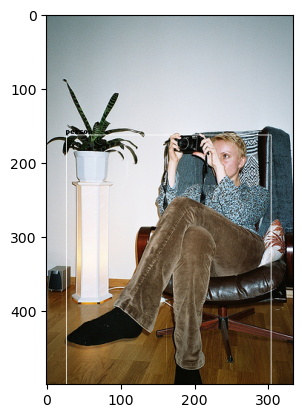

In [24]:
annotation_file = annotation_random[0]
with open(annotation_file, "r") as file:
    annotation_list = file.read().split("\n")[:-1]
    annotation_list = [x.split(" ") for x in annotation_list]
    annotation_list = [[float(y) for y in x ] for x in annotation_list]

#Get the corresponding image file
image_file = annotation_file.replace("txt", "jpg")
assert os.path.exists(image_file)

#Load the image
image = Image.open(image_file)

#Plot the Bounding Box
plot_bounding_box(image, annotation_list)

## ЗАДАНИЕ

Обучите модель **yolov5**,  используя готовый `train.py` файл репозитория https://github.com/ultralytics/yolov5.git.

Для данной модели изображения и классы объектов должны находиться в папках images и labels, соответсвенно.

Протестируйте модель на валидациооной выборке и выведите на экран полученные изображения с bbox и классами объектов.

## Split data for YOLO

In [25]:
image_ids = xml_df['filename'].unique()
train_ids = image_ids[:int(0.9*len(image_ids))]
val_ids = image_ids[int(0.9*len(image_ids)):]


print(f'# изображений {len(image_ids)}')
print(f'# train изображений {len(train_ids)}')
print(f'# val изображений {len(val_ids)}')

# изображений 1326
# train изображений 1193
# val изображений 133


In [26]:
train_df = xml_df[xml_df['filename'].isin(train_ids)]
val_df = xml_df[xml_df['filename'].isin(val_ids)]

In [27]:
# create train, val, test folders
output_folders = ["train", "val"]
for folder in output_folders:
    if not os.path.exists(folder):
        os.makedirs(folder)

# Creating subfolders inside the main folders
subfolders = ["images", "labels"]
for upper_folder in output_folders:
    for subfolder in subfolders:
        subfolder_path = os.path.join(upper_folder, subfolder)
        if not os.path.exists(subfolder_path):
            os.makedirs(subfolder_path)


In [28]:
# split images to train, test folders

def iamge_folderator(df, path, source):
  for index, row in df.iterrows():
    filename = row['filename']
    source_path = os.path.join(source, filename)
    destination_path = os.path.join(path, filename)

    shutil.copy(source_path, destination_path)

# annotations to labels folder
def label_folderator(df, path, source):
  for index, row in df.iterrows():
    filename = row['filename']
    filename_without_extension = os.path.splitext(filename)[0]
    new_filename = filename_without_extension + ".txt"

    source_path = os.path.join(source, new_filename)
    destination_path = os.path.join(path, new_filename)

    shutil.copy(source_path, destination_path)

In [29]:
iamge_folderator(train_df, '/kaggle/working/train/images', '/kaggle/working/VOCdevkit/VOC2012/JPEGImages')
iamge_folderator(val_df, '/kaggle/working/val/images', '/kaggle/working/VOCdevkit/VOC2012/JPEGImages')

label_folderator(train_df, '/kaggle/working/train/labels', '/kaggle/working/VOCdevkit/VOC2012/JPEGImages')
label_folderator(val_df, '/kaggle/working/val/labels', '/kaggle/working/VOCdevkit/VOC2012/JPEGImages')


In [30]:
keys_list = list(mapping.keys())

In [31]:
data = {
    'train': '/kaggle/working/train/',
    'val': '/kaggle/working/val',
    'nc': len(xml_df['class'].unique()),
    'names': keys_list


    }

with open('data.yaml', 'w') as yaml_file:
    yaml.dump(data, yaml_file)

In [32]:
!git clone https://github.com/ultralytics/yolov5  # clone
!cd yolov5
!pip install -r /kaggle/working/yolov5/requirements.txt  # install

Cloning into 'yolov5'...
remote: Enumerating objects: 16111, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (22/22), done.
remote: Total 16111 (delta 7), reused 5 (delta 0), pack-reused 16089
Receiving objects: 100% (16111/16111), 14.85 MiB | 29.30 MiB/s, done.
Resolving deltas: 100% (11030/11030), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 35.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.5/660.5 kB 47.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.5/819.5 kB 47.4 MB/s eta 0:00:00
  Attempting uninstall: setuptools
    Found existing installation: setuptools 59.8.0
    Uninstalling setuptools-59.8.0:
      Successfully uninstalled setuptools-59.8.0
  Attempting uninstall: Pillow
    Found existing installation: Pillow 9.5.0
    Uninstalling Pillow-9.5.0:
      Successfully uninstalled Pillow-9.5.0
ERROR: pip's dependency resolver does not currently take into account all the pack

In [33]:
RES_DIR = '/kaggle/working/result_dir'

## YOLO training

In [34]:
!python /kaggle/working/yolov5/train.py --batch 16 --weights yolov5m.pt --freeze 21  --epochs 50 --data /kaggle/working/data.yaml --cache --img 512 --name {RES_DIR} --hyp /kaggle/working/yolov5/data/hyps/hyp.scratch-low.yaml

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5m.pt, cfg=, data=/kaggle/working/data.yaml, hyp=/kaggle/working/yolov5/data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=512, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=/kaggle/working/result_dir, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[21], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_

In [35]:
result = pd.read_csv("/kaggle/working/result_dir/results.csv")
result.tail()

,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,metrics/mAP_0.5:0.95,val/box_loss,val/obj_loss,val/cls_loss,x/lr0,x/lr1,x/lr2
45,45,0.033518,0.015577,0.013072,0.49217,0.66095,0.63467,0.50715,0.026677,0.009484,0.007784,0.001288,0.001288,0.001288
46,46,0.031661,0.015389,0.012642,0.57337,0.62193,0.61532,0.50173,0.026517,0.009334,0.008967,0.001090,0.001090,0.001090
47,47,0.032073,0.015843,0.013542,0.62574,0.63507,0.63534,0.51174,0.025221,0.009404,0.009104,0.000892,0.000892,0.000892
48,48,0.031282,0.015060,0.013125,0.49419,0.65287,0.63745,0.51438,0.025985,0.009493,0.009973,0.000694,0.000694,0.000694
49,49,0.032048,0.014764,0.012534,0.49553,0.68159,0.63663,0.52431,0.025498,0.009397,0.008558,0.000496,0.000496,0.000496


## vizualize results

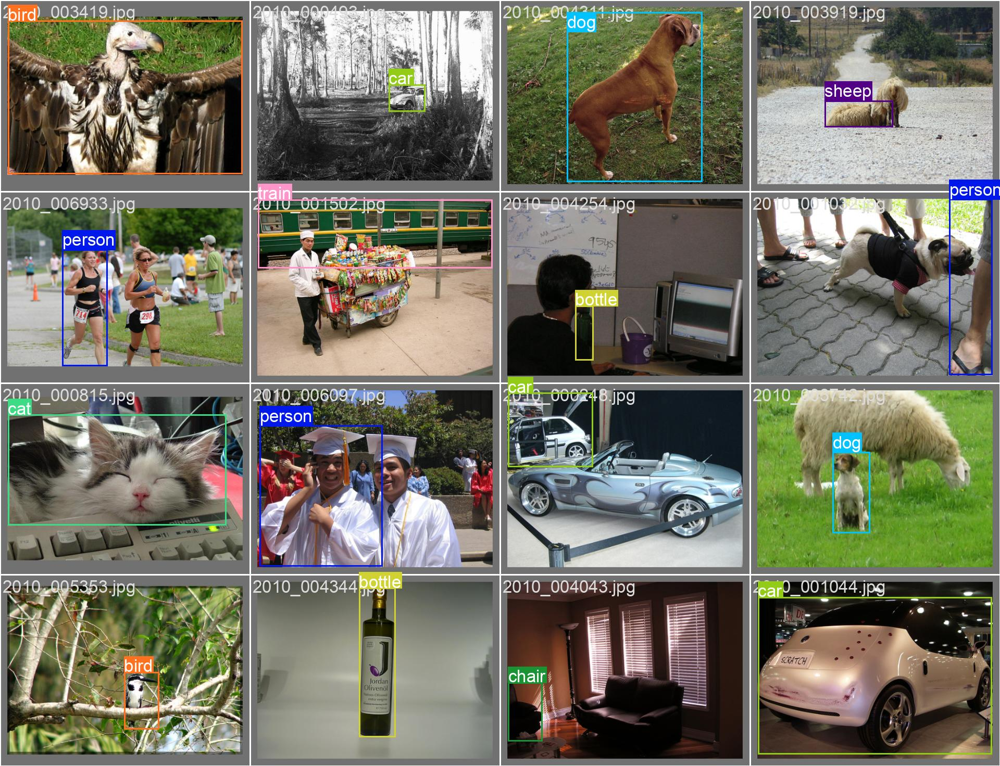

In [36]:
#Load the image
image = Image.open('/kaggle/working/result_dir/val_batch1_labels.jpg')
image

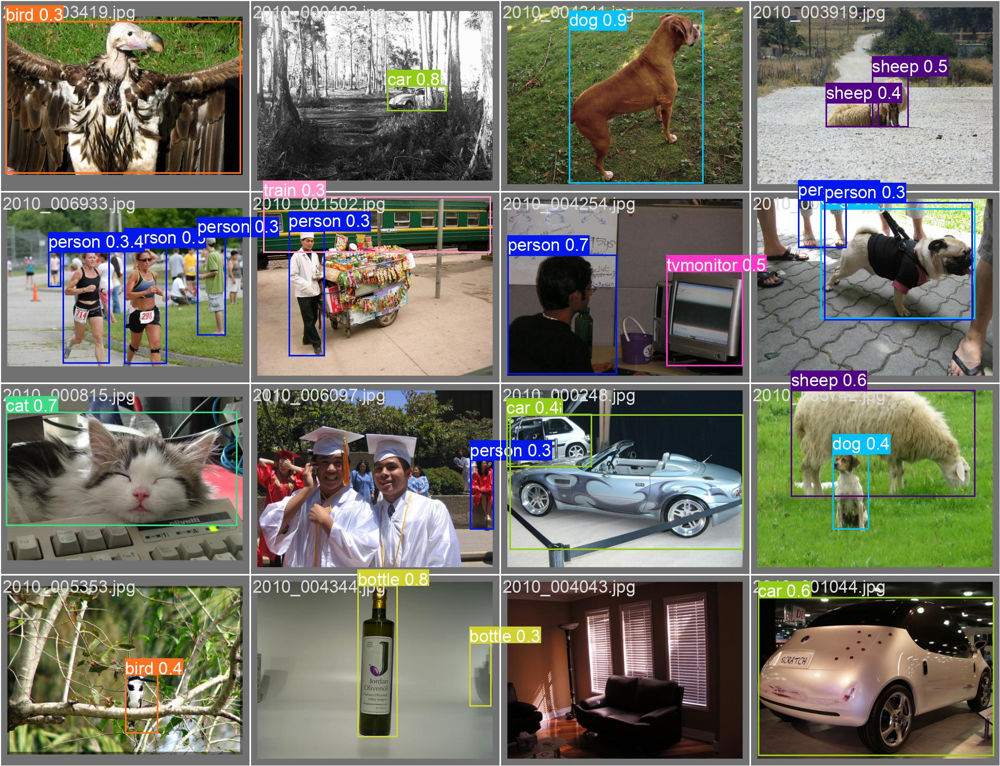

In [37]:
#Load the image
image = Image.open('/kaggle/working/result_dir/val_batch1_pred.jpg')
image

# Сделайте сравнение текущей модели с Faster RCNN по скорости и качетсву.

## Data prepearing for rcnn

In [38]:
import torch
from PIL import Image
import os
import json

class CustomDataset(Dataset):
    def __init__(self, df, image_dir, phase='train'):
        super().__init__()
        self.df = df
        self.image_dir = image_dir
        self.images = df['filename'].unique()
        self.transforms = get_transforms(phase)


    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_name = self.images[idx]
        image_path = os.path.join(self.image_dir, image_name)
        image_arr = cv2.imread(image_path, cv2.IMREAD_COLOR)

        if image_arr is None:
            raise ValueError(f"Image at path {image_path} could not be loaded")

        image_arr = cv2.cvtColor(image_arr, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_arr /= 255.0

        point = self.df[self.df['filename'] == image_name]
        boxes = point[['xmin', 'ymin', 'xmax', 'ymax']].values

        if len(boxes) == 0:
            print(f"No bounding boxes found for image {image_name}. Skipping.")
            return None, None  # Возвращаем None, чтобы обработать это в DataLoader

        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        area = torch.as_tensor(area, dtype=torch.float32)
        labels = torch.as_tensor(point['class'].values, dtype=torch.int64)

        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        target['image_id'] = torch.tensor([idx])
        target['area'] = area

        if self.transforms:
            sample = {
                'image': image_arr,
                'bboxes': target['boxes'],
                'labels': target['labels']
            }
            sample = self.transforms(**sample)
            image_arr = sample['image']

            if len(sample['bboxes']) == 0:
                print(f"No bounding boxes remaining after transformations for image {image_name}. Skipping.")
                return None, None  # Аналогично, возвращаем None

            target['boxes'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1, 0)

        return image_arr, target


In [39]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

def get_transforms(phase):
            list_transforms = []
            if phase == 'train':
                  list_transforms.extend([
                                          Flip(p=0.5)
                                        ])
            list_transforms.extend(
                [
                 ToTensor(),
                ])
            list_trfms = Compose(list_transforms,
                                 bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
            return list_trfms



In [40]:
train_dir = 'VOCdevkit/VOC2012/JPEGImages/'

train_data = CustomDataset(train_df, train_dir, phase='train')
val_data = CustomDataset(val_df, train_dir, phase='validation')

print(f'Размер обучающей выборки {len(train_data)}')
print(f'Размер валидационной выборки {len(val_data)}')

Размер обучающей выборки 1193
Размер валидационной выборки 133


In [41]:
batch = 4

def collate_fn(batch):
    return tuple(zip(*batch))


# Define the data loaders
train_data_loader = DataLoader(
    train_data, batch_size=4, shuffle=True, num_workers=2, collate_fn=collate_fn)

val_data_loader = DataLoader(
    val_data, batch_size=4, shuffle=False, num_workers=2, collate_fn=collate_fn)

In [42]:
# Replace the classifier with a new one for your specific number of classes
num_classes = len(xml_df['class'].unique())+1
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Define the loss function and optimizer
optimizer = torch.optim.SGD(model.parameters(), lr=0.0005, momentum=0.9, weight_decay=0.0005)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 206MB/s]  


## rcnn teaching

In [43]:
import torch

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# set to device
model.to(device)

num_epochs = 20  # Количество эпох обучения

for epoch in range(num_epochs):
    model.train()  # train mode
    running_loss = 0.0

    for images, targets in train_data_loader:
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # zero grad
        optimizer.zero_grad()

        # stragth forward
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        # back forward
        losses.backward()
        optimizer.step()

        running_loss += losses.item()

    avg_train_loss = running_loss / len(train_data_loader)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_train_loss:.4f}")

Epoch [1/20], Loss: 0.6348
Epoch [2/20], Loss: 0.4685
Epoch [3/20], Loss: 0.4056
Epoch [4/20], Loss: 0.3522
Epoch [5/20], Loss: 0.3259
Epoch [6/20], Loss: 0.2994
Epoch [7/20], Loss: 0.2870
Epoch [8/20], Loss: 0.2710
Epoch [9/20], Loss: 0.2651
Epoch [10/20], Loss: 0.2517
Epoch [11/20], Loss: 0.2392
Epoch [12/20], Loss: 0.2398
Epoch [13/20], Loss: 0.2307
Epoch [14/20], Loss: 0.2176
Epoch [15/20], Loss: 0.2148
Epoch [16/20], Loss: 0.2109
Epoch [17/20], Loss: 0.2001
Epoch [18/20], Loss: 0.1981
Epoch [19/20], Loss: 0.1955
Epoch [20/20], Loss: 0.1911


In [44]:
# transform image
def transform_image(image, device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')):
    transform = T.Compose([T.ToTensor()])
    return transform(image).unsqueeze(0).to(device)

In [50]:
val_images_path = '/kaggle/working/val/images/'
yolov5_model = '/kaggle/working/result_dir/weights/best.pt'
y_model = torch.hub.load('ultralytics/yolov5', 'custom', path=yolov5_model)


# choose random image
val_images = os.listdir(val_images_path)
random_image = random.choice(val_images)

def evaluate_model(model, image, transform=None, device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')):
    # transform if needed
    if transform:
        image = transform(image)

    # time count
    start_time = time.time()
    with torch.no_grad():
        prediction = model(image)
    end_time = time.time()

    execution_time = end_time - start_time

    return prediction, execution_time

# Testing
image = Image.open((val_images_path + random_image)) # Load image
yolo_prediction, yolo_time = evaluate_model(y_model, image)
model.eval()  # Set the model to evaluation mode
faster_rcnn_prediction, faster_rcnn_time = evaluate_model(model, image, transform_image)

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-12-18 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 212 layers, 20929713 parameters, 0 gradients, 48.1 GFLOPs
Adding AutoShape... 


In [51]:
print('faster_rcnn_time:', faster_rcnn_time)
print('yolo_time:', yolo_time)
print('faster_rcnn_prediction:', faster_rcnn_prediction)
print('yolo_prediction:', yolo_prediction)

faster_rcnn_time: 0.06387901306152344
yolo_time: 0.05946540832519531
faster_rcnn_prediction: [{'boxes': tensor([[141.45848, 186.30260, 321.04099, 304.46783],
        [136.10353, 185.39543, 316.58853, 297.16882],
        [142.18944, 183.91594, 323.38763, 305.93408],
        [136.14842, 176.11703, 308.04736, 298.52155]], device='cuda:0'), 'labels': tensor([16, 11,  9,  7], device='cuda:0'), 'scores': tensor([0.65955, 0.48397, 0.10684, 0.09055], device='cuda:0')}]
yolo_prediction: image 1/1: 375x500 1 cat
Speed: 5.8ms pre-process, 51.5ms inference, 1.6ms NMS per image at shape (1, 3, 480, 640)


In [52]:
mappingg = {i: label for i, label in enumerate(le.classes_)}

def draw_boxes(image, boxes, labels, colors):
    print("Функция draw_boxes вызвана")
    draw = ImageDraw.Draw(image)
    for box, label in zip(boxes, labels):
        print(f"Рисуем box: {box}, label: {label}")
        xmin, ymin, xmax, ymax = box
        draw.rectangle(((xmin, ymin), (xmax, ymax)), outline=colors[label], width=3)
        draw.text((xmin, ymin), label, fill=colors[label])

# color map
colors = {label: tuple(np.random.randint(0, 256, 3)) for label in mapping.keys()}

# pred convertation YOLOv5
yolo_boxes = [[x[0], x[1], x[2], x[3]] for x in yolo_prediction.xyxy[0].cpu().numpy()]
yolo_labels = [mappingg[int(x[5])] for x in yolo_prediction.xyxy[0].cpu().numpy()]


# pred convert. Faster R-CNN
faster_rcnn_boxes = [[box[0], box[1], box[2], box[3]] for box in faster_rcnn_prediction[0]['boxes'].cpu().numpy()]
faster_rcnn_labels = [mappingg[label.item()] for label in faster_rcnn_prediction[0]['labels'].cpu().numpy()]

# open image
original_image = Image.open(val_images_path + random_image).convert("RGB")

# visualize YOLOv5
yolo_image = original_image.copy()
draw_boxes(yolo_image, yolo_boxes, yolo_labels, colors)
yolo_image

# visualize Faster R-CNN
faster_rcnn_image = original_image.copy()
draw_boxes(faster_rcnn_image, faster_rcnn_boxes, faster_rcnn_labels, colors)


Функция draw_boxes вызвана
Рисуем box: [135.67268, 190.06648, 322.35254, 299.39612], label: cat
Функция draw_boxes вызвана
Рисуем box: [141.45848, 186.3026, 321.041, 304.46783], label: sheep
Рисуем box: [136.10353, 185.39543, 316.58853, 297.16882], label: dog
Рисуем box: [142.18944, 183.91594, 323.38763, 305.93408], label: cow
Рисуем box: [136.14842, 176.11703, 308.04736, 298.52155], label: cat


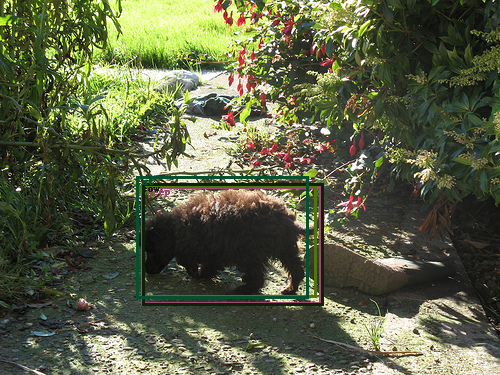

In [53]:
faster_rcnn_image

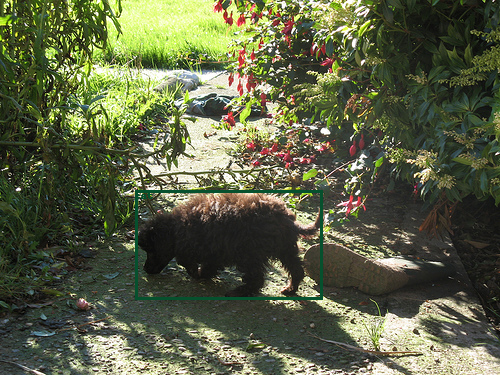

In [54]:
yolo_image


# Conclusions
## Time
* faster_rcnn_time: 0.06
* yolo_time: 0.02
### yolo is defenetly faster than rcnn a spatialy if comparing training

## Quality
### rcnn shows worse results, but it founds more entities I think if make better hyper- parameter search it will show much better results than YOLO. YOLO wins because of speed, so if I will need to indicate single something, I deffenetly choose YOLO

